In [1]:
import warnings
warnings.filterwarnings('ignore')

import logging

In [2]:
import os
import json
import umap
import time
import torch
import pickle
import xmltodict
import numpy as np
import pandas as pd
import transformers
import seaborn as sns
import sklearn.manifold
import pywikipathways as pwpw
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

from tqdm import tqdm
from peft import PeftModel
from llm2vec import LLM2Vec
from collections import Counter
from sentence_transformers import SentenceTransformer
from transformers import AutoTokenizer, AutoModel, AutoConfig

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler

import PAGER as pager
PAGER = pager.PAGER()

logging.getLogger("transformers").setLevel(logging.ERROR)

## Pathway Annotations and Description Summarization

### Extracting Low-level Pathway Annotations and Descriptions from WikiPathway

In [3]:
# using wikipathway api to extract pathway annotations
pathway_info = {}
sub_dir = "../data/case_study/geneset_enrichment_analysis/"
for df_path in sorted(os.listdir(sub_dir)):
    df = pd.read_csv(sub_dir + df_path)
    for index, row in df.iterrows():
        pathway_info[row['GS_ID']] = {
            "NAME": row['NAME'],
            "LINK": row['LINK'],
            "WP_ID": row['LINK'].split(":")[-1],
        }

# getting all the pathway annotations using pywikipathways api
failed_wp_ids = {}
failed_wp_desc = []
for key in tqdm(list(pathway_info.keys())):
    try:
        gpml = pwpw.get_pathway(pathway_info[key]["WP_ID"])
        gpml_dict = xmltodict.parse(gpml)
        
        ### pathway description
        try:
            if type(gpml_dict["Pathway"]["Comment"]) == type([]):
                for comment_dict in gpml_dict["Pathway"]["Comment"]:
                    if type(comment_dict) == type({}) and "#text" in comment_dict.keys() and comment_dict["@Source"] == "WikiPathways-description":
                        pathway_info[key]["Description"] = comment_dict["#text"].strip()
            elif type(gpml_dict["Pathway"]["Comment"]) == type({}):
                assert gpml_dict["Pathway"]["Comment"]["@Source"] == "WikiPathways-description"
                pathway_info[key]["Description"] = gpml_dict["Pathway"]["Comment"]["#text"].strip()
            assert "Description" in pathway_info[key].keys()
        except Exception as e:
            failed_wp_desc.append(pathway_info[key]["WP_ID"])
            
        ### pathway ontologies
        if type(gpml_dict["Pathway"]["Biopax"]["bp:openControlledVocabulary"]) == type([]):
            for ontology in gpml_dict["Pathway"]["Biopax"]["bp:openControlledVocabulary"]:
                if type(ontology["bp:Ontology"]) == type(""):
                    if ontology["bp:Ontology"] not in pathway_info[key].keys():
                        pathway_info[key][ontology["bp:Ontology"]] = ontology["bp:TERM"]
                    else:
                        pathway_info[key][ontology["bp:Ontology"]] = f'{pathway_info[key][ontology["bp:Ontology"]]} && {ontology["bp:TERM"]}'
                elif type(ontology["bp:Ontology"]) == type({}):
                    if ontology["bp:Ontology"]["#text"] not in pathway_info[key].keys():
                        pathway_info[key][ontology["bp:Ontology"]["#text"]] = ontology["bp:TERM"]["#text"]
                    else:
                        pathway_info[key][ontology["bp:Ontology"]["#text"]] = f'{pathway_info[key][ontology["bp:Ontology"]["#text"]]} && {ontology["bp:TERM"]["#text"]}'
        elif type(gpml_dict["Pathway"]["Biopax"]["bp:openControlledVocabulary"]) == type({}):
            ontology = gpml_dict["Pathway"]["Biopax"]["bp:openControlledVocabulary"]
            if type(ontology["bp:Ontology"]) == type(""):
                onto_key = ontology["bp:Ontology"]
                onto_val = ontology["bp:TERM"]
                if onto_key not in pathway_info[key].keys():
                    pathway_info[key][onto_key] = onto_val
                else:
                    pathway_info[key][onto_key] = f'{pathway_info[key][onto_key]} && {onto_val}'
            elif type(ontology["bp:Ontology"]) == type({}):
                onto_key = ontology["bp:Ontology"]["#text"]
                onto_val = ontology["bp:TERM"]["#text"]
                if onto_key not in pathway_info[key].keys():
                    pathway_info[key][onto_key] = onto_val
                else:
                    pathway_info[key][onto_key] = f'{pathway_info[key][onto_key]} && {onto_val}'
        else:
            print(f'### TYPE ERROR L1: {type(type(gpml_dict["Pathway"]["Biopax"]["bp:openControlledVocabulary"]))}')
    except Exception as e:
        failed_wp_ids[pathway_info[key]["WP_ID"]] = e

100%|██████████| 774/774 [02:46<00:00,  4.64it/s]


In [4]:
pathway_info

{'WAG002659': {'NAME': 'Focal adhesion: PI3K-Akt-mTOR-signaling pathway',
  'LINK': 'https://www.wikipathways.org/index.php/Pathway:WP3932',
  'WP_ID': 'WP3932',
  'Description': 'Cell-matrix adhesions play important roles in biological processes such as cell motility, cell proliferation, cell differentiation, regulation of gene expression and cell survival. Focal adhesions are structures formed at the cell-extracellular matrix contact points, consisting of bundles of actin filaments anchored to trans-membrane receptors of the integrin family through a complex of multiple proteins. In addition to participating in the structural link between membrane receptors and the actin cytoskeleton, focal adhesions also contain signaling molecules, such as protein kinases and phosphatases, their substrates, and various adapter proteins. Integrin signaling is dependent on the non-receptor tyrosine kinase activities of the FAK and src proteins and the adaptor protein functions of FAK, src and Shc to 

In [8]:
len(pathway_info.keys())

774

In [6]:
error_counter = Counter(str(error) for error in list(failed_wp_ids.values()))
print(error_counter)

Counter({"'bp:openControlledVocabulary'": 44, 'no element found: line 1, column 0': 11})


**Explanation of error message**

    "bp:openControlledVocabulary": There is no annotations in the WikiPathway page.
    "no element found: line 1, column 0": There is no valid page for the given ID.

In [7]:
print(f"Descriptions not found for {len(failed_wp_desc)} pathway.")

Descriptions not found for 1 pathway.


In [9]:
key_list = []
for key in pathway_info.keys():
    key_list.append(list(pathway_info[key].keys()))
element_counts = Counter(element for sublist in key_list for element in sublist)
element_counts

Counter({'NAME': 774,
         'LINK': 774,
         'WP_ID': 774,
         'Description': 763,
         'Pathway Ontology': 715,
         'Disease': 215,
         'Cell Type': 151,
         'Human Disease Ontology': 2,
         'Cell Ontology': 2})

    No description found for 1 pathway and no xml found for 10 pathways. Thus, we've got descriptions for 763 pathways out of 774.
    Also note, majority of the pathways got pathway ontology annotations, in contrast with disease and cell type annotations.

### Prompting Llama-3.1-8B for Pathway Description Summarization

In [4]:
model_id = "meta-llama/Meta-Llama-3.1-8B-Instruct"

pipeline = transformers.pipeline(
    "text-generation",
    model=model_id,
    model_kwargs={"torch_dtype": torch.bfloat16},
    device_map="auto",
    token="hf_***",    # huggingface token to access llama3 models
)

Loading checkpoint shards: 100%|██████████| 4/4 [00:21<00:00,  5.35s/it]


In [37]:
instruction = "Refine the provided biological pathway description by removing \
all alphanumeric IDs, URLs, and external references. If the description \
is brief or missing, create a factual summary based on recent literature, \
avoiding speculation. For lengthy descriptions, produce a concise summary \
that highlights the key functions and significance of the pathway. Provide \
only the refined text in one coherent paragraph of up to 300 words, \
omitting headers and details of deletions."

for pathway in tqdm(pathway_info.items()):
    key = pathway[0]
    if "Description" in pathway[1].keys():
        content = f'{pathway[1]["NAME"]}: {pathway[1]["Description"]}'
    else:
        content = f'{pathway[1]["NAME"]}'

    messages = [
        {"role": "system", "content": instruction},
        {"role": "user", "content": content},
    ]

    outputs = pipeline(
        messages,
        max_new_tokens=512,
        do_sample=False,
        temperature=0.3,
    )
    pathway_info[key]["Summary"] = outputs[0]["generated_text"][-1]["content"]

100%|██████████| 774/774 [1:11:06<00:00,  5.51s/it]


### Sample from Pathway Description and Summary

In [18]:
print(f'{pathway_info["WAG003294"]["NAME"]}: {pathway_info["WAG003294"]["Description"]}')

Sudden infant death syndrome (SIDS) susceptibility pathways: In this model, we provide an integrated view of Sudden Infant Death Syndrome (SIDS) at the level of implicated tissues, signaling networks and genetics. The purpose of this model is to serve as an overview of research in this field and recommend new candidates for more focused or genome wide analyses. SIDS is the sudden and unexpected death of an infant (less than 1 year of age), almost always during deep sleep, where no cause of death can be found by autopsy. Factors that mediate SIDS are likely to be both biological and behavioral, such as sleeping position, environment and stress during a critical phase of infant development (http://www.nichd.nih.gov/health/topics/Sudden_Infant_Death_Syndrome.cfm). While no clear diagnostic markers currently exist, several polymorphisms have been identified which are significantly over-represented in distinct SIDS ethnic population. The large majority of these polymorphisms exist in genes 

In [19]:
print(f'{pathway_info["WAG003294"]["Summary"]}')

Sudden infant death syndrome (SIDS) is the sudden and unexpected death of an infant under one year of age, often occurring during deep sleep, with no identifiable cause of death. Research suggests that SIDS is influenced by both biological and behavioral factors, including sleeping position, environment, and stress during a critical phase of infant development. Genetic studies have identified several polymorphisms associated with SIDS, primarily in genes related to neuronal signaling, cardiac contraction, and inflammatory response. The autonomic nervous system, particularly the raphe nucleus of the brain stem, is strongly implicated in SIDS, with ultrastructural, cellular, and molecular changes observed in this region. Genes associated with serotonin synthesis and receptivity, such as TPH2, SLC6A4, and HTR1A, have been linked to SIDS, with decreased expression of SLC6A4 and HTR1A observed in SIDS cases. Other factors, including vasopressin signaling, nicotine exposure, and cardiac arrh

In [39]:
json.dump(pathway_info, open("../data/case_study/pathway_details/annotations_with_summary.json", "w"))

### Retrieving High-level Ontology Labels from BioPortal

The pathway ontology annotations are often very low level. To determine the high-level class of those ontologies, we've downloaded pathway ontology file (.obo) from BioPortal (link: https://bioportal.bioontology.org/ontologies/PW?p=classes). Thus, parsing from the ontology file, we've mapped the low level ontology labels to high level classes (i.e., drug pathway, disease pathway, classic metabolic pathway, signaling pathway, regulatory pathway) of pathway ontologies.

There was some name synchronization issues in the original ontology file, `data/case_study/pathway_details/BioPortal_ontology
_original.obo`. We've mitigated the issues manually and stored the modified file, `data/case_study/pathway_details/BioPortal_
ontology_modified.obo`.

In [11]:
all_po_names = []
for key in pathway_info.keys():
    if "Pathway Ontology" in pathway_info[key]:
        all_po_names.extend(pathway_info[key]["Pathway Ontology"].split(" && "))
all_po_names = sorted(list(set(all_po_names)))
len(all_po_names), all_po_names[:5]

(427,
 ['3-hydroxy-3-methylglutaryl-CoA lyase deficiency pathway',
  '3-methylcrotonyl CoA carboxylase 1 deficiency pathway',
  '3-methylcrotonyl CoA carboxylase 2 deficiency pathway',
  'ACE inhibitor drug pathway',
  'AMPK signaling pathway'])

In [12]:
def parse_obo(file_path):
    """
    Parse a OBO (Open Biomedical Ontologies) file.

    Args:
    file_path (str): Path to the OBO file.

    Returns:
    dict: A dictionary of terms, where each term is a dictionary containing
          'name', 'is_a', and 'children' keys.
    """
    with open(file_path, 'r') as file:
        lines = file.readlines()

    terms = {}
    current_id = None

    for line in lines:
        if line.startswith('[Term]'):
            current_id = None
        elif line.startswith('id:'):
            current_id = line.strip().split(' ')[1]
            terms[current_id] = {'name': '', 'is_a': [], 'children': [], 'synonyms': []}
        elif line.startswith('name:') and current_id:
            terms[current_id]['name'] = line.strip().split(' ', 1)[1]
        elif line.startswith('def:') and current_id:
            terms[current_id]['def'] = line.strip().split('"')[1]
        elif line.startswith('is_a:') and current_id:
            parent_id = line.strip().split(' ')[1]
            terms[current_id]['is_a'].append(parent_id)
            if parent_id in terms:
                terms[parent_id]['children'].append(current_id)
        elif line.startswith('relationship: part_of') and current_id:
            parent_id = line.strip().split(' ')[2]
            terms[current_id]['is_a'].append(parent_id)
            if parent_id in terms:
                terms[parent_id]['children'].append(current_id)
        elif line.startswith('synonym:'):
            synonym = line.strip().split('"')[1]
            terms[current_id]['synonyms'].append(synonym)
    return terms

def check_elements(list1, list2):
    return all(element in list2 for element in list1)

def build_root_mapping(terms, roots):
    """
    Build a dictionary mapping term names and their synonyms to their roots.

    Args:
    terms (dict): The dictionary of terms.
    roots (list): List of root IDs.

    Returns:
    dict: A dictionary mapping term names and synonyms to their root IDs.
    """
    root_mapping = {}

    def find_root(term_id, terms, roots):
        """
        Recursively find the root of a given term.
        """
        if term_id in roots:
            return term_id
        if 'is_a' in terms[term_id] and terms[term_id]['is_a']:
            return find_root(terms[term_id]['is_a'][0], terms, roots)
        return None

    for term_id, term_data in terms.items():
        root_id = find_root(term_id, terms, roots)
        if root_id:
            root_mapping[term_data['name'].lower()] = terms[root_id]["name"]
            for synonym in term_data.get('synonyms', []):
                root_mapping[synonym.lower()] = terms[root_id]["name"]

    return root_mapping

terms = parse_obo('../data/case_study/pathway_details/BioPortal_ontology_modified.obo')
roots = terms["PW:0000001"]["children"]
root_mapping = build_root_mapping(terms, roots)

len(root_mapping.keys()), Counter(list(root_mapping.values()))

(5106,
 Counter({'drug pathway': 1187,
          'disease pathway': 1183,
          'classic metabolic pathway': 1045,
          'signaling pathway': 916,
          'regulatory pathway': 775}))

In [13]:
# sanity check
failed_pw = []
for po in all_po_names:
    try:
        root_mapping[po.lower()]
    except:
        failed_pw.append(po)
len(failed_pw), failed_pw

(1, ['Pathway Ontology'])

In [14]:
# patch
root_mapping["pathway ontology"] = "regulatory pathway"

## Embedding Generation

### Prompting MiniLM, mpnet, Mistral-7B and Llama3-8B for Embedding Generation

In [20]:
unique_pathway_ids = sorted(list(pathway_info.keys()))

gene_list_length = []
for ids in tqdm(unique_pathway_ids):
    PAGRankedGenes = PAGER.pagRankedGene(ids)
    gene_list_length.append(len(PAGRankedGenes["GENE_SYM"]))

100%|██████████| 774/774 [07:06<00:00,  1.81it/s]


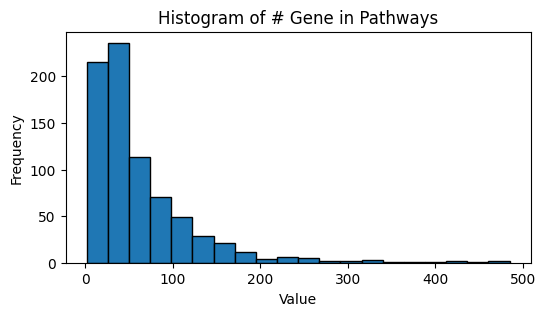

In [21]:
plt.figure(figsize=(6, 3))
plt.hist(gene_list_length, bins=20, edgecolor='black')

plt.title('Histogram of # Gene in Pathways')
plt.xlabel('Value')
plt.ylabel('Frequency')

plt.show()

In [23]:
np.percentile(gene_list_length, 75)

82.5

In [24]:
### gene_symbol_prompts
# prompt structure: "gene_symbol_a, gene_symbol_b, ... "
# characteristics: gene_sorting: RP_SCORE (descending), gene_count: 100

### gene_description_prompts
# prompt structure: "gene_symbol_a (gene_description), gene_symbol_b (gene_description), ... "
# characteristics: gene_sorting: RP_SCORE (descending), gene_count: 100

gene_symbol_prompts = {}
gene_description_prompts = {}
for ids in tqdm(unique_pathway_ids):
    PAGRankedGenes = PAGER.pagRankedGene(ids)

    PAGRankedGenes["RP_SCORE"] = PAGRankedGenes["RP_SCORE"].astype(float)
    PAGRankedGenes["RP_SCORE"] = PAGRankedGenes["RP_SCORE"].fillna(0)
    PAGRankedGenes = PAGRankedGenes.sort_values(by="RP_SCORE", ascending=False).head(100)
    gene_symbol_prompts[ids] = " ".join([a for a in PAGRankedGenes["GENE_SYM"]])
    
    PAGRankedGenes = PAGRankedGenes.head(100)    
    gene_description_prompts[ids] = ", ".join([f"{a} ({b})" for a, b in zip(PAGRankedGenes["GENE_SYM"], PAGRankedGenes["DESCRIPTION"])])

100%|██████████| 774/774 [06:22<00:00,  2.02it/s]


In [26]:
gene_symbol_prompts["WAG003294"]

'EP300 CREBBP JUN HDAC1 SP1 PRKACA CTNNB1 CREB1 AR VEGFA IL6 TNF NR3C1 NFKB1 IL1B CEBPB HIF1A NGF GAPDH YWHAZ BDNF YWHAE HDAC9 TH PRKACB ESR2 YWHAH CASP3 IL10 EGR1 YWHAQ YWHAG MEF2C SST PPARGC1A HSPD1 PRKAR2A SP3 PRKAR2B RORA ADCYAP1 GRIN1 TPH1 PRKAR1A TCF3 HTR1A YWHAB CREM YBX1 TAC1 THRB IL1A NFKB2 VAMP2 POU5F1 SOX2 CPT1A ASCL1 IL13 MYB SPTBN1 GATA3 HES1 POU2F2 MECP2 PRKAR1B SNTA1 KCNH2 PHOX2A NANOG RET NFYA CHAT RYR2 IL1RN SCN5A CHRNA4 DDC HADHA RUNX3 GJA1 PBX1 MAOA CHRM2 GATA2 KCNQ1 MAP2 PHOX2B IL6R HTR2A ACADM AVP TACR1 SLC6A4 GCK NKX2-2 TP73 HTR3A HADHB MAZ'

In [27]:
gene_description_prompts["WAG003294"]

'EP300 (E1A binding protein p300), CREBBP (CREB binding protein), JUN (Jun proto-oncogene, AP-1 transcription factor subunit), HDAC1 (histone deacetylase 1), SP1 (Sp1 transcription factor), PRKACA (protein kinase cAMP-activated catalytic subunit alpha), CTNNB1 (catenin beta 1), CREB1 (cAMP responsive element binding protein 1), AR (androgen receptor), VEGFA (vascular endothelial growth factor A), IL6 (interleukin 6), TNF (tumor necrosis factor), NR3C1 (nuclear receptor subfamily 3 group C member 1), NFKB1 (nuclear factor kappa B subunit 1), IL1B (interleukin 1 beta), CEBPB (CCAAT enhancer binding protein beta), HIF1A (hypoxia inducible factor 1 subunit alpha), NGF (nerve growth factor), GAPDH (glyceraldehyde-3-phosphate dehydrogenase), YWHAZ (tyrosine 3-monooxygenase/tryptophan 5-monooxygenase activation protein zeta), BDNF (brain derived neurotrophic factor), YWHAE (tyrosine 3-monooxygenase/tryptophan 5-monooxygenase activation protein epsilon), HDAC9 (histone deacetylase 9), TH (tyro

In [28]:
### gene_symbol_llm2vec_prompts
# prompt structure: [instruction, "gene_symbol_a, gene_symbol_b, ... "]
# characteristics: gene_sorting: RP_SCORE (descending), gene_count: 100

### gene_description_llm2vec_prompts
# prompt structure: [instruction, "gene_symbol_a (gene_description), gene_symbol_b (gene_description), ... "]
# characteristics: gene_sorting: RP_SCORE (descending), gene_count: 100

gene_symbol_instruction = (
    "Given a list of gene symbols, encode the collective biological significance and pathway associations of these genes:"
)

gene_description_instruction = (
    "Given a list of gene symbols and its description, encode the collective biological significance and pathway associations of these genes:"
)

gene_symbol_llm2vec_prompts = {}
gene_description_llm2vec_prompts = {}
for ids in tqdm(unique_pathway_ids):
    gene_symbol_llm2vec_prompts[ids] = [gene_symbol_instruction, gene_symbol_prompts[ids]]
    gene_description_llm2vec_prompts[ids] = [gene_description_instruction, gene_description_prompts[ids]]

100%|██████████| 774/774 [00:00<00:00, 1015131.74it/s]


In [29]:
json.dump(gene_symbol_prompts, open("../data/case_study/prompts/gene_symbol.json", "w"))
json.dump(gene_description_prompts, open("../data/case_study/prompts/gene_description.json", "w"))

json.dump(gene_symbol_llm2vec_prompts, open("../data/case_study/prompts/gene_symbol_llm2vec.json", "w"))
json.dump(gene_description_llm2vec_prompts, open("../data/case_study/prompts/gene_description_llm2vec.json", "w"))

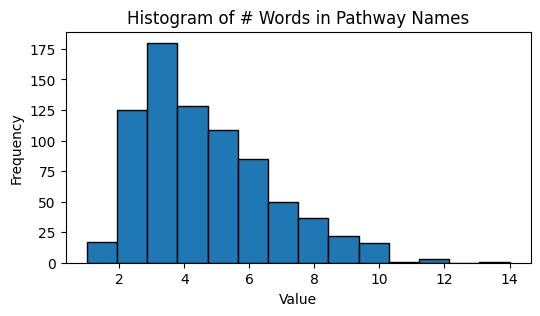

In [40]:
pathway_name_len = [len(pathway_info[key]["NAME"].strip().split(" ")) for key in pathway_info.keys()]

plt.figure(figsize=(6, 3))
plt.hist(pathway_name_len, bins=14, edgecolor='black')

plt.title('Histogram of # Words in Pathway Names')
plt.xlabel('Value')
plt.ylabel('Frequency')

plt.show()

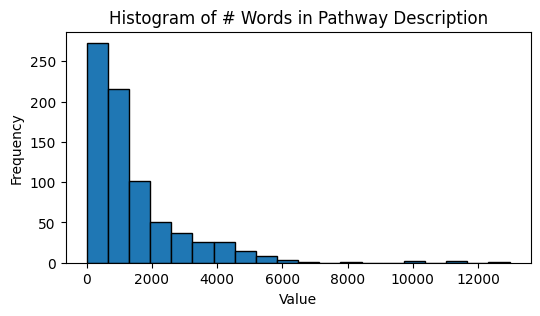

In [41]:
pathway_desc_len = [len(pathway_info[key]["Description"].strip()) for key in pathway_info.keys() if "Description" in pathway_info[key].keys()]

plt.figure(figsize=(6, 3))
plt.hist(pathway_desc_len, bins=20, edgecolor='black')

plt.title('Histogram of # Words in Pathway Description')
plt.xlabel('Value')
plt.ylabel('Frequency')

plt.show()

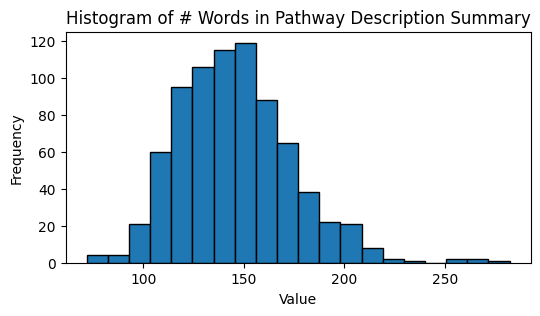

In [42]:
pathway_summary_len = [len(pathway_info[key]["Summary"].split(" ")) for key in pathway_info.keys() if "Summary" in pathway_info[key].keys()]

plt.figure(figsize=(6, 3))
plt.hist(pathway_summary_len, bins=20, edgecolor='black')

plt.title('Histogram of # Words in Pathway Description Summary')
plt.xlabel('Value')
plt.ylabel('Frequency')

plt.show()

In [43]:
pathway_name_prompts = {}
pathway_description_summary_prompts = {}
for ids in tqdm(unique_pathway_ids):
    pathway_name_prompts[ids] = pathway_info[ids]["NAME"]
    pathway_description_summary_prompts[ids] = pathway_info[ids]["Summary"]

100%|██████████| 774/774 [00:00<00:00, 1127219.20it/s]


In [44]:
json.dump(pathway_name_prompts, open("../data/case_study/prompts/pathway_name.json", "w"))
json.dump(pathway_description_summary_prompts, open("../data/case_study/prompts/pathway_description_summary.json", "w"))

In [45]:
pathway_name_prompts["WAG003294"]

'Sudden infant death syndrome (SIDS) susceptibility pathways'

In [46]:
pathway_description_summary_prompts["WAG003294"]

'Sudden infant death syndrome (SIDS) is the sudden and unexpected death of an infant under one year of age, often occurring during deep sleep, with no identifiable cause of death. Research suggests that SIDS is influenced by both biological and behavioral factors, including sleeping position, environment, and stress during a critical phase of infant development. Genetic studies have identified several polymorphisms associated with SIDS, primarily in genes related to neuronal signaling, cardiac contraction, and inflammatory response. The autonomic nervous system, particularly the raphe nucleus of the brain stem, is strongly implicated in SIDS, with ultrastructural, cellular, and molecular changes observed in this region. Genes associated with serotonin synthesis and receptivity, such as TPH2, SLC6A4, and HTR1A, have been linked to SIDS, with decreased expression of SLC6A4 and HTR1A observed in SIDS cases. Other factors, including vasopressin signaling, nicotine exposure, and cardiac arr

In [49]:
pathway_name_instruction = (
    "Given a pathway name, encode the biological significance and functional associations of this pathway:"
)

pathway_description_instruction = (
    "Given a pathway name and its description, encode the biological significance and functional associations of this pathway:"
)

pathway_name_llm2vec_prompts = {}
pathway_description_summary_llm2vec_prompts = {}
for ids in tqdm(unique_pathway_ids):
    pathway_name_llm2vec_prompts[ids] = [pathway_name_instruction, pathway_info[ids]["NAME"]]
    pathway_description_summary_llm2vec_prompts[ids] = [pathway_description_instruction, pathway_info[ids]["Summary"]]

100%|██████████| 774/774 [00:00<00:00, 783584.67it/s]


In [52]:
json.dump(pathway_name_llm2vec_prompts, open("../data/case_study/prompts/pathway_name_llm2vec.json", "w"))
json.dump(pathway_description_summary_llm2vec_prompts, open("../data/case_study/prompts/pathway_description_summary_llm2vec.json", "w"))

### Embeddings from Encoder-based Language Models
Model Sources: https://www.sbert.net/docs/sentence_transformer/pretrained_models.html

In [55]:
# utility

def get_label(po_names):
    counter = Counter([root_mapping[po.lower()] for po in po_names.split(" && ")])
    return max(counter, key=counter.get)

# Compute cosine similarity
def compute_cosine_similarity(embedding_1, embedding_2):
    q_reps_norm = torch.nn.functional.normalize(embedding_1, p=2, dim=1)
    d_reps_norm = torch.nn.functional.normalize(embedding_2, p=2, dim=1)
    cos_sim = torch.mm(q_reps_norm, d_reps_norm.transpose(0, 1))
    return cos_sim

def prepare_prompts(prompts):
    labels = []
    embedding_text = []
    for key, pi in pathway_info.items():
        if "Pathway Ontology" in pi.keys():
            label = get_label(pi["Pathway Ontology"])
            if label != "drug pathway":                # as drug pathway has only two labels, we've eliminated those.
                embedding_text.append(prompts[key])
                labels.append(label)
    assert len(labels) == len(embedding_text)
    return embedding_text, labels

def reduce_dimentions(data, method="TSNE"):
    if method == "TSNE":
        return sklearn.manifold.TSNE().fit_transform(data)
    if method == "UMAP":
        return umap.UMAP().fit_transform(data)
    if method == "PCA":
        return sklearn.decomposition.PCA(n_components=2).fit_transform(data)
    return f"{method} not implemented. Should be TSNE, UMAP or PCA."

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def get_model_details(model):
    total_parameters = count_parameters(model)
    print(f"# vocab size: {model.tokenizer.vocab_size}")
    print(f"trainable parameters: {total_parameters}")
    print(model)

In [57]:
get_model_details(SentenceTransformer('all-MiniLM-L6-v2'))
get_model_details(SentenceTransformer("all-mpnet-base-v2"))

# vocab size: 30522
trainable parameters: 22713216
SentenceTransformer(
  (0): Transformer({'max_seq_length': 256, 'do_lower_case': False}) with Transformer model: BertModel 
  (1): Pooling({'word_embedding_dimension': 384, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
  (2): Normalize()
)
# vocab size: 30527
trainable parameters: 109486464
SentenceTransformer(
  (0): Transformer({'max_seq_length': 384, 'do_lower_case': False}) with Transformer model: MPNetModel 
  (1): Pooling({'word_embedding_dimension': 768, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
  (2): Normalize()
)


In [59]:
for prompt_type in [
    "gene_symbol",
    "gene_description",
    "pathway_name",
    "pathway_description_summary"
]:
    encoder_prompts = json.load(open(f"../data/case_study/prompts/{prompt_type}.json"))
    embedding_text, labels = prepare_prompts(encoder_prompts)

    model = SentenceTransformer("all-mpnet-base-v2")
    mpnet_embeddings = model.encode(embedding_text)

    model = SentenceTransformer('all-MiniLM-L6-v2')
    minilm_embeddings = model.encode(embedding_text)

    np.save(f"../data/case_study/embeddings/mpnet_{prompt_type}.npy", mpnet_embeddings)
    np.save(f"../data/case_study/embeddings/minilm_{prompt_type}.npy", minilm_embeddings)

    print(prompt_type, mpnet_embeddings.shape, minilm_embeddings.shape)

gene_symbol (713, 768) (713, 384)
gene_description (713, 768) (713, 384)
pathway_name (713, 768) (713, 384)
pathway_description_summary (713, 768) (713, 384)


### Large Language Model Embeddings using llm2vec 

In [61]:
### for Llama-3-8B
model_nick = "llama3"
model_name = "McGill-NLP/LLM2Vec-Meta-Llama-3-8B-Instruct-mntp"
postfix = "supervised"

# ## for Mistral-7B
# model_nick = "mistral"
# model_name = "McGill-NLP/LLM2Vec-Mistral-7B-Instruct-v2-mntp"
# postfix = "unsup-simcse"

tokenizer = AutoTokenizer.from_pretrained(model_name)
config = AutoConfig.from_pretrained(model_name, trust_remote_code=True)
model = AutoModel.from_pretrained(
    model_name,
    trust_remote_code=True,
    config=config,
    torch_dtype=torch.bfloat16,
    device_map="cuda" if torch.cuda.is_available() else "cpu",
    token="hf_***",  # huggingface token to access llama3 models
)

# Loading MNTP (Masked Next Token Prediction) model.
model = PeftModel.from_pretrained(model, model_name)

model = model.merge_and_unload()  # This can take several minutes on cpu
# Loading supervised model. This loads the trained LoRA weights on top of MNTP model. Hence the final weights are -- Base model + MNTP (LoRA) + supervised (LoRA).
model = PeftModel.from_pretrained(model, f"{model_name}-{postfix}")

# Wrapper for encoding and pooling operations
l2v = LLM2Vec(model, tokenizer, pooling_mode="mean", max_length=512)

assert len(tokenizer) == model.config.vocab_size
print(f"# vocabulary for {model_nick}: {len(tokenizer)}")

prompt_root = "../data/case_study/prompts/"
for prompt_file in os.listdir(prompt_root):
    if "llm2vec" in prompt_file:
        llm2vec_prompts = json.load(open(prompt_root+prompt_file))
        embedding_text, labels = prepare_prompts(llm2vec_prompts)
        
        embeddings = l2v.encode(embedding_text)
        print(prompt_file, embeddings.shape)
        np.save(f'../data/case_study/embeddings/{model_nick}_{prompt_file.split(".")[0]}.npy', embeddings.numpy())

Loading checkpoint shards: 100%|██████████| 4/4 [00:20<00:00,  5.07s/it]


# vocabulary for llama3: 128256


Batches: 100%|██████████| 23/23 [00:19<00:00,  1.21it/s]


gene_symbol_llm2vec.json torch.Size([713, 4096])


Batches: 100%|██████████| 23/23 [00:03<00:00,  6.00it/s]


pathway_name_llm2vec.json torch.Size([713, 4096])


Batches: 100%|██████████| 23/23 [00:24<00:00,  1.08s/it]


pathway_description_summary_llm2vec.json torch.Size([713, 4096])


Batches: 100%|██████████| 23/23 [00:35<00:00,  1.53s/it]

gene_description_llm2vec.json torch.Size([713, 4096])


## Embedding Visualization

In [68]:
dimentionality_reduction_method = "UMAP"
embedding_root = "../data/case_study/embeddings"
num_models = 4  # Number of different models
num_embeddings_per_model = 4  # Number of embeddings per model

# Create an empty list of lists for storing embeddings
embeddings = [[[] for _ in range(num_embeddings_per_model)] for _ in range(num_models)]
umap_projection = [[[] for _ in range(num_embeddings_per_model)] for _ in range(num_models)]
tsne_projection = [[[] for _ in range(num_embeddings_per_model)] for _ in range(num_models)]

for idx, model_name in enumerate(["minilm", "mpnet", "mistral", "llama3"]):
    if model_name in ["mistral", "llama3"]:
        prompt_type = "_llm2vec"
    else:
        prompt_type = ""        
    for jdx, em_path in enumerate([
        f"gene_symbol{prompt_type}", \
        f"gene_description{prompt_type}", \
        f"pathway_name{prompt_type}",\
        f"pathway_description_summary{prompt_type}",\
    ]):
        embedding_file_name = f"{embedding_root}/{model_name}_{em_path}.npy"
        embeddings[idx][jdx] = np.load(embedding_file_name)
        umap_projection[idx][jdx] = reduce_dimentions(embeddings[idx][jdx], "UMAP")
        tsne_projection[idx][jdx] = reduce_dimentions(embeddings[idx][jdx], "TSNE")
        print(embedding_file_name, embeddings[idx][jdx].shape, umap_projection[idx][jdx].shape, tsne_projection[idx][jdx].shape)

../data/case_study/embeddings/minilm_gene_symbol.npy (713, 384) (713, 2)
../data/case_study/embeddings/minilm_gene_description.npy (713, 384) (713, 2)
../data/case_study/embeddings/minilm_pathway_name.npy (713, 384) (713, 2)
../data/case_study/embeddings/minilm_pathway_description_summary.npy (713, 384) (713, 2)
../data/case_study/embeddings/mpnet_gene_symbol.npy (713, 768) (713, 2)
../data/case_study/embeddings/mpnet_gene_description.npy (713, 768) (713, 2)
../data/case_study/embeddings/mpnet_pathway_name.npy (713, 768) (713, 2)
../data/case_study/embeddings/mpnet_pathway_description_summary.npy (713, 768) (713, 2)
../data/case_study/embeddings/mistral_gene_symbol_llm2vec.npy (713, 4096) (713, 2)
../data/case_study/embeddings/mistral_gene_description_llm2vec.npy (713, 4096) (713, 2)
../data/case_study/embeddings/mistral_pathway_name_llm2vec.npy (713, 4096) (713, 2)
../data/case_study/embeddings/mistral_pathway_description_summary_llm2vec.npy (713, 4096) (713, 2)
../data/case_study/emb

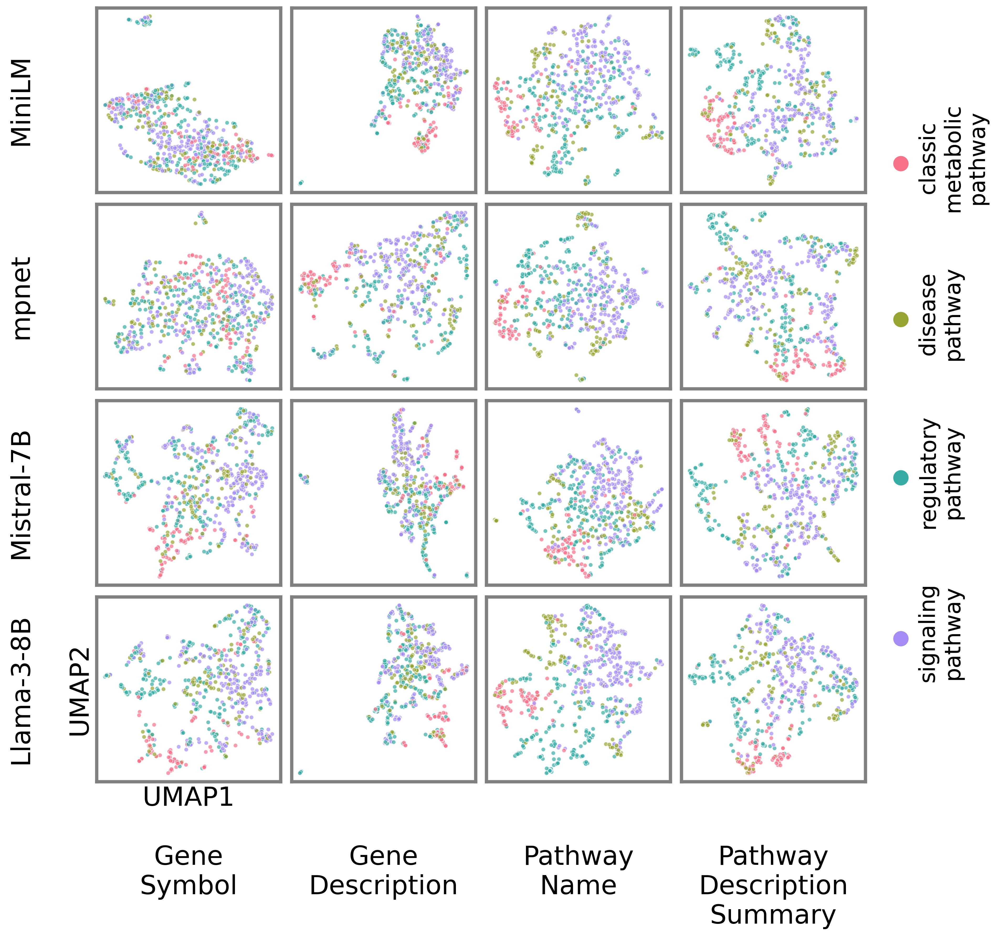

In [69]:
lower_dim_embeddings = tsne_projection
dimentionality_reduction_method = "TSNE"

from matplotlib.legend_handler import HandlerLine2D

palette = sns.color_palette("husl", len(np.unique(labels)))
label_to_color = {label: palette[i] for i, label in enumerate(np.unique(labels))}
colors = [label_to_color[label] for label in labels]

def plot_tsne(embedding, labels, ax, add_labels=False):
    ax.scatter(embedding[:, 0], embedding[:, 1], c=colors, s=15, alpha=0.7, edgecolors='w', linewidth=0.5)
    ax.set_xticks([])
    ax.set_yticks([])

    # Set all spines as visible and with a bold line width
    for spine in ax.spines.values():
        spine.set_linewidth(3)
        spine.set_alpha(1)
        spine.set_color('gray')
        spine.set_visible(True)

nrows = num_models
ncols = num_embeddings_per_model
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(3*ncols, 3*nrows), dpi=300)

for model_idx in range(nrows):
    for embedding_idx in range(ncols):
        ax = axes[model_idx][embedding_idx]
        plot_tsne(lower_dim_embeddings[model_idx][embedding_idx], labels, ax)

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=15, label=label)
           for label, color in label_to_color.items()]
legend = fig.legend(handles=handles, labels=[label.replace(' ', '\n') for label in label_to_color.keys()],
                    loc='right', bbox_to_anchor=(1.06, 0.58), frameon=False,
                    handler_map={plt.Line2D: HandlerLine2D(numpoints=1)},
                    handletextpad=0,
                    columnspacing=1,
                    handlelength=3,
                    handleheight=0,
                    labelspacing=5)      
for text in legend.get_texts():
    text.set_horizontalalignment('center')
fig.add_artist(legend)
for text, line in zip(legend.get_texts(), legend.get_lines()):
    text.set_rotation(90)
    text.set_fontsize(20)

model_nicks = ["MiniLM", "mpnet", "Mistral-7B", "Llama-3-8B"]
for i, ax in enumerate(axes[:, 0]):
    y_label = f"{model_nicks[i]}\n\n"
    if i == 3:
        y_label += f"{dimentionality_reduction_method}2"
    ax.set_ylabel(y_label, fontsize=24)

prompt_technique = ["Gene\nSymbol", \
                    "Gene\nDescription", \
                    "Pathway\nName", \
                    "Pathway\nDescription\nSummary"]
for j, ax in enumerate(axes[-1, :]):
    x_label = f"\n\n{prompt_technique[j]}"
    if j == 0:
        x_label = f"{dimentionality_reduction_method}1" + x_label
    ax.set_xlabel(x_label, fontsize=24)

plt.tight_layout()
plt.subplots_adjust(right=0.92)
plt.savefig(f"../data/case_study/plots/{dimentionality_reduction_method}.png", format='png', bbox_inches='tight', dpi=300)
plt.show()

In [70]:
from matplotlib.colors import ListedColormap

n_colors = len(np.unique(labels))  # Adjust this based on your 'labels'
palette = sns.color_palette("husl", n_colors)
cmap = ListedColormap(palette)

def plot_decision_boundaries(X, y, clf, method, ax):
    h = .02  # step size in the mesh
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    ax.contourf(xx, yy, Z, cmap=cmap, alpha=0.5)

    ax.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap, alpha=0.9, edgecolors='w', linewidth=0.5)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel(f"{method}1")
    ax.set_ylabel(f"{method}2")
    ax.set_title(method)

def get_accuracy(X, y):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y, random_state=42)
    
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    clf = svm.SVC(kernel='rbf', C=1.0, gamma='scale')
    clf.fit(X_train_scaled, y_train)
    y_pred = clf.predict(X_test_scaled)

    accuracy = accuracy_score(y_test, y_pred)
    return round(accuracy, 2), clf, scaler

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(np.array(labels))

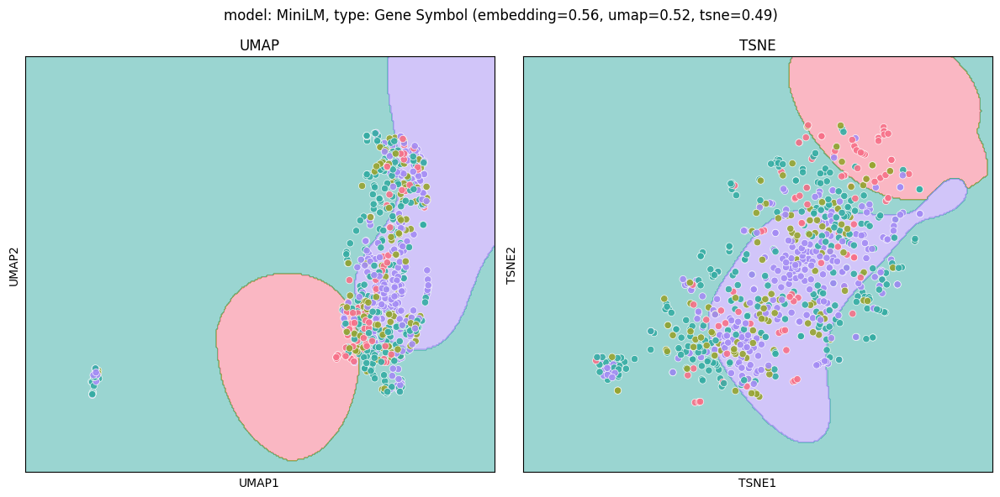

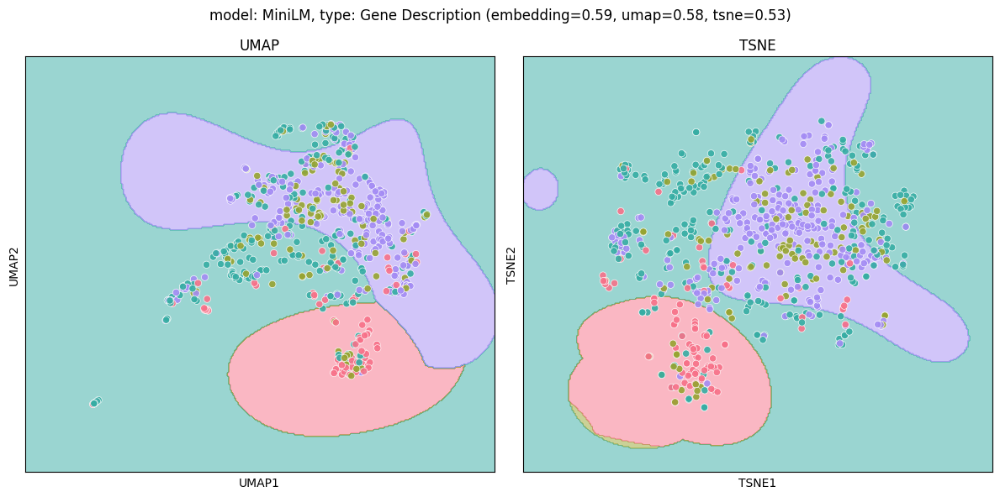

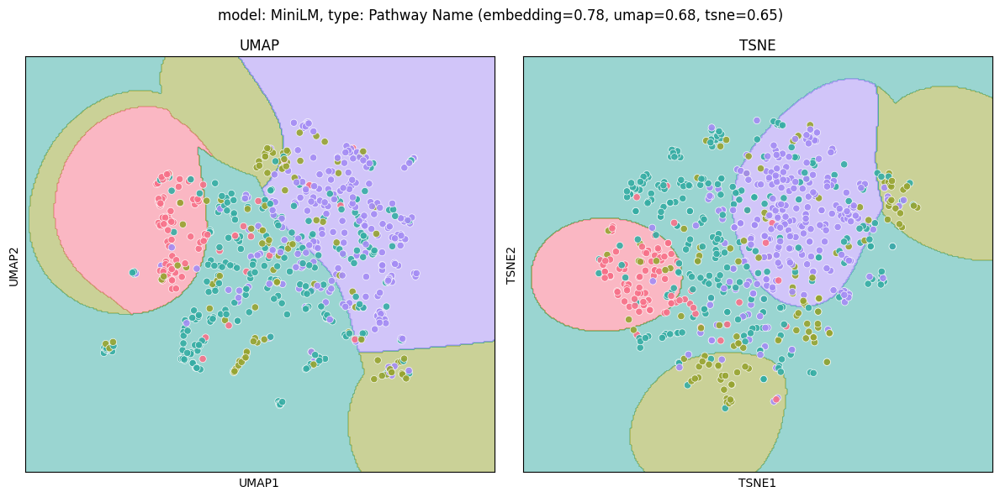

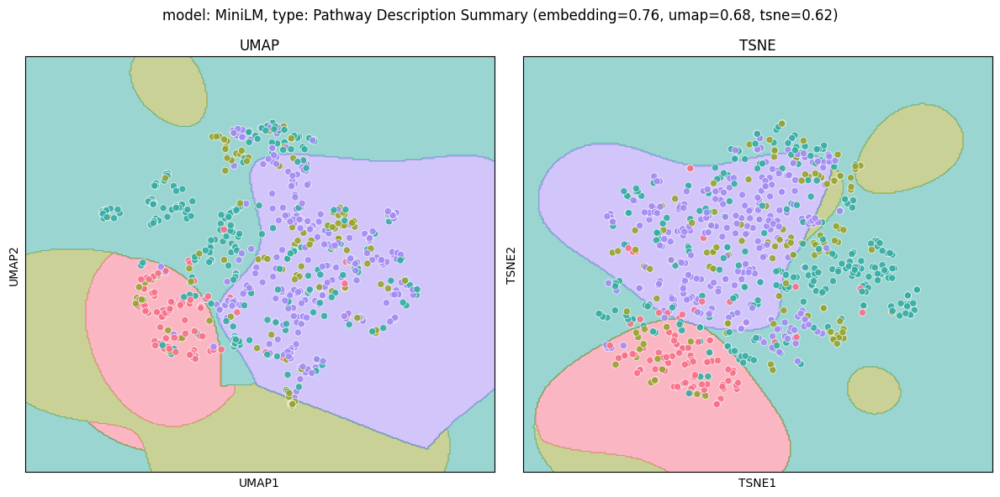

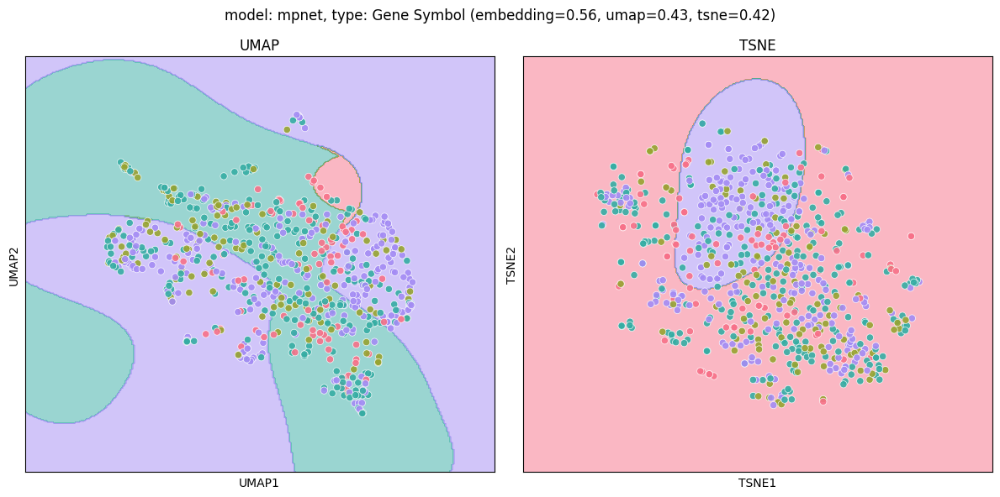

...

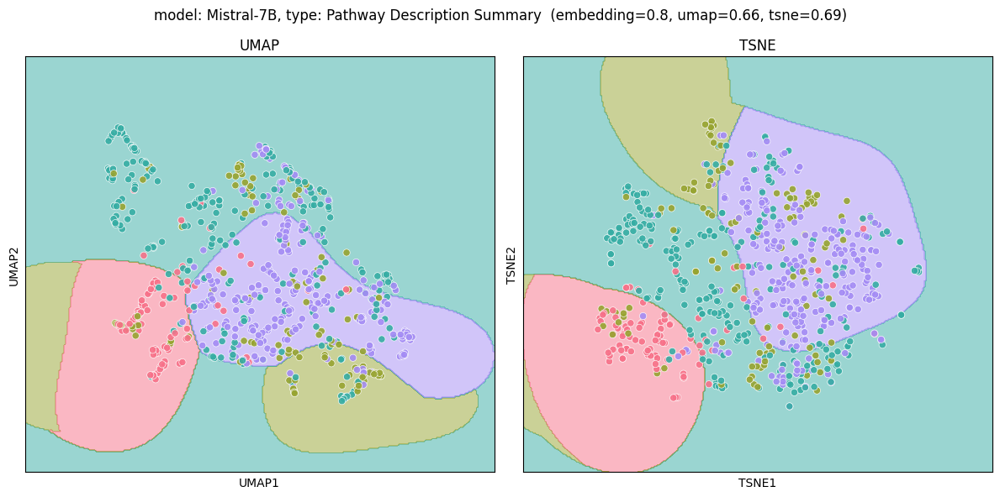

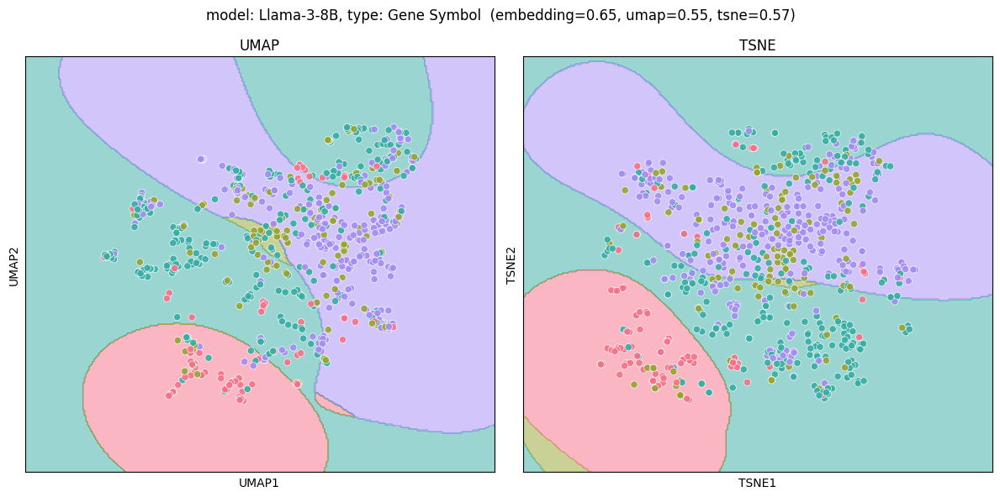

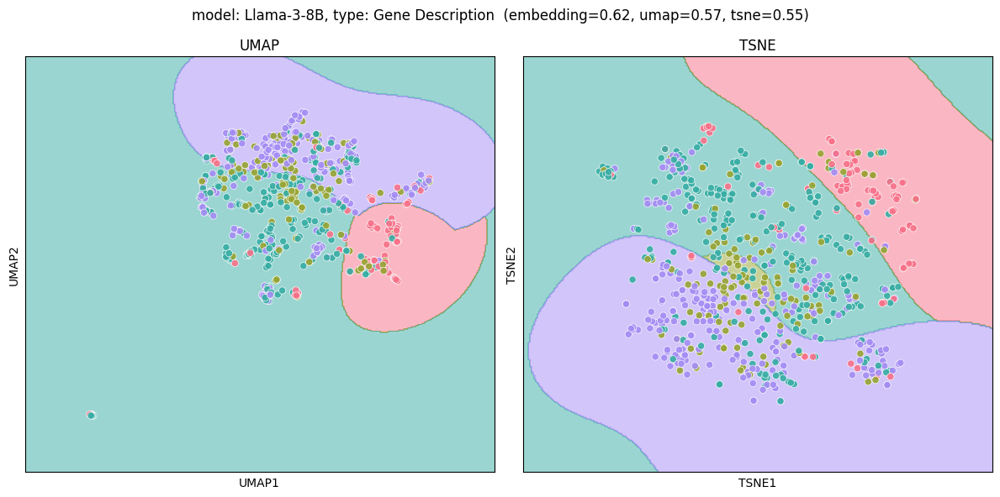

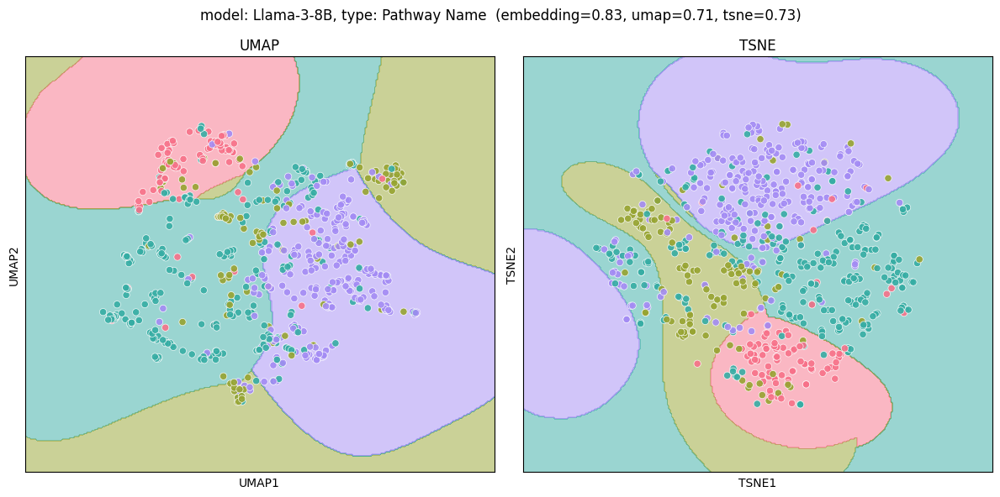

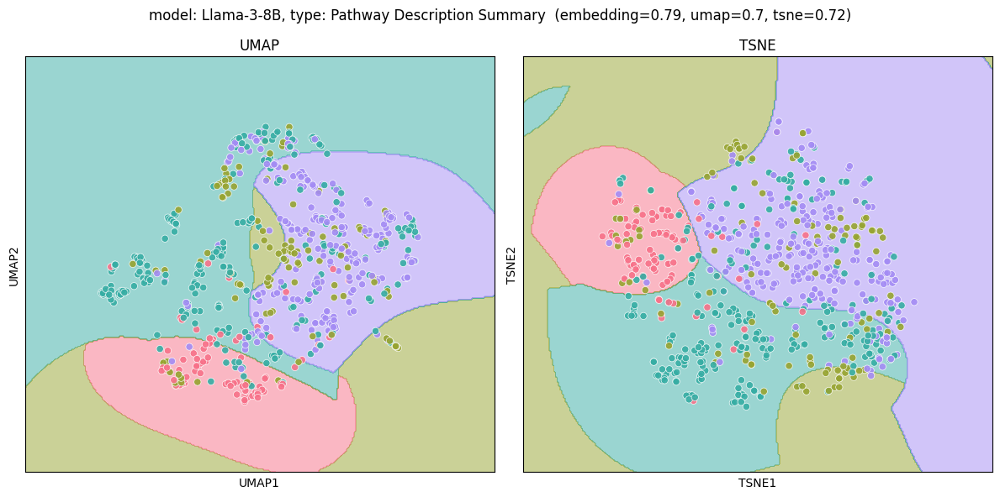

In [73]:
actual_model_names = {
    "minilm": "MiniLM",
    "mistral": "Mistral-7B",
    "mpnet": "mpnet",
    "llama3": "Llama-3-8B"
}

all_accuracy = []
umap_accuracy = []
tsne_accuracy = []
embedding_root = "../data/case_study/embeddings"
for idx, model_name in enumerate(["minilm", "mpnet", "mistral", "llama3"]):
    if model_name in ["mistral", "llama3"]:
        prompt_type = "_llm2vec"
    else:
        prompt_type = ""        
    for jdx, embedding_type in enumerate([
        f"gene_symbol{prompt_type}", \
        f"gene_description{prompt_type}", \
        f"pathway_name{prompt_type}",\
        f"pathway_description_summary{prompt_type}",\
    ]):
        embedding_file_name = f"{embedding_root}/{model_name}_{embedding_type}.npy"
        embeddings = np.load(embedding_file_name)
        umap_embeddings = reduce_dimentions(embeddings, method="UMAP")
        tsne_embeddings = reduce_dimentions(embeddings, method="TSNE")
        
        acc, _, _ = get_accuracy(embeddings, y)
        all_accuracy.append(acc)

        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6), dpi=100)

        umap_acc, clf, scaler = get_accuracy(umap_embeddings, y)
        plot_decision_boundaries(scaler.transform(umap_embeddings), y, clf, "UMAP", axes[0])
        umap_accuracy.append(umap_acc)

        tsne_acc, clf, scaler = get_accuracy(tsne_embeddings, y)
        plot_decision_boundaries(scaler.transform(tsne_embeddings), y, clf, "TSNE", axes[1])
        tsne_accuracy.append(tsne_acc)

        plt.suptitle(f'model: {actual_model_names[model_name]}, type: {" ".join(embedding_type.replace("_prompts", "").replace("llm2vec", "").split("_")).title()} (embedding={acc}, umap={umap_acc}, tsne={tsne_acc})')
        plt.tight_layout()
        savefig_name = embedding_file_name.replace("embeddings/", "plots/comparisons/").replace("npy", "png")
        plt.savefig(savefig_name, format='png', bbox_inches='tight')
        plt.show()

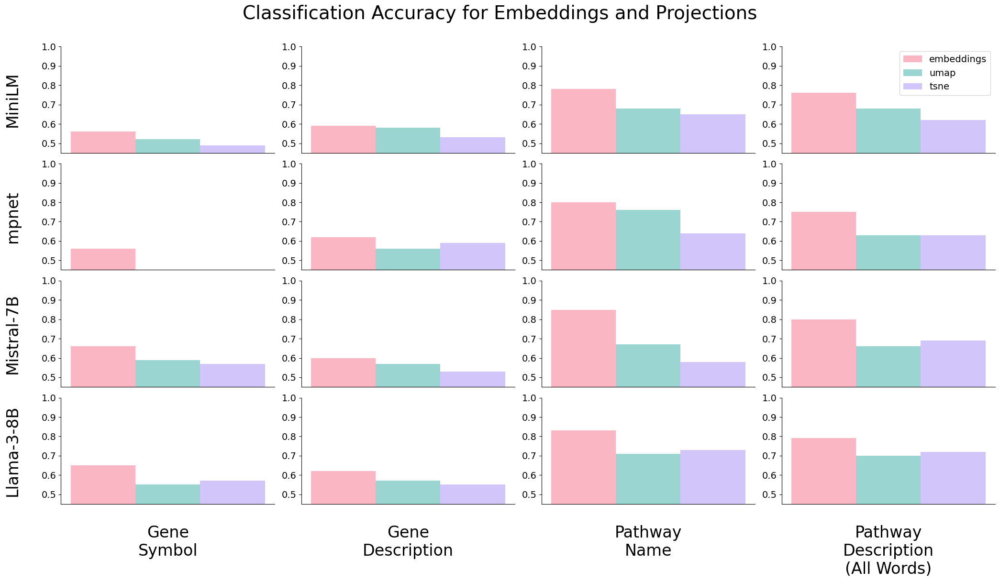

In [74]:
bar_colors = [cmap(i/n_colors) for i in range(n_colors)]

fig, axes = plt.subplots(nrows=num_models, ncols=num_embeddings_per_model, figsize=(21, 12), dpi=100)  # Adjust figsize as needed
fig.subplots_adjust(hspace=0.5, wspace=0.5)  # Adjust spacing as needed

# Plotting each set of accuracies
for i, ax in enumerate(axes.flatten()):
    if i < 28:  # Ensure we do not go out of index bounds
        indices = np.arange(1)
        widths = 0.25

        # Bar chart for each accuracy list at index i
        ax.bar(indices, all_accuracy[i], width=widths, label='embeddings', color=bar_colors[0], alpha=0.5)
        ax.bar(indices + widths, umap_accuracy[i], width=widths, label='umap', color=bar_colors[2], alpha=0.5)
        ax.bar(indices + 2*widths, tsne_accuracy[i], width=widths, label='tsne', color=bar_colors[3], alpha=0.5)

        ax.set_ylim([0.45, 1.0])  # Set y-axis limits
        ax.set_xticks([])  # Center x-ticks between bars
        # ax.set_xticklabels([f'Test {i+1}'])
        ax.set_yticks(np.linspace(0.5, 1.0, 6))  # Set y-ticks for uniformity
        ax.tick_params(axis='y', which='major', labelsize=14)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

        if i == 3:  # Add legend to only the first subplot to avoid repetition
            ax.legend(loc="upper right", fontsize=14)

model_nicks = ["MiniLM", "mpnet", "Mistral-7B", "Llama-3-8B"]
for i, ax in enumerate(axes[:, 0]):
    y_label = f"{model_nicks[i]}\n"
    ax.set_ylabel(y_label, fontsize=24)

prompt_technique = ["Gene\nSymbol", \
                    "Gene\nDescription", \
                    "Pathway\nName", \
                    "Pathway\nDescription\nSummary"]
for j, ax in enumerate(axes[-1, :]):
    x_label = f"\n{prompt_technique[j]}"
    ax.set_xlabel(x_label, fontsize=24)
            
# Adjust layout to make it tight and save the plot
plt.suptitle("Classification Accuracy for Embeddings and Projections", fontsize=28, y=1.01)
plt.tight_layout()
plt.savefig('../data/case_study/plots/accuracy_plot.png', dpi=300)  # Save as high resolution
plt.show()

**TSNE** Projection of **Llama-3-8B** embeddings generated from **Pathway Description Summary** is the best projection according to our analysis. From now on, we'll be using this 2d co-ordinates to locate the pathways.

### Misc

In [112]:
# Tokenize the prompt
tokenized_output = tokenizer(prompts["WAG001990"][1])

# Extract token IDs
token_ids = tokenized_output['input_ids']

# Convert token IDs to tokens
tokens = tokenizer.convert_ids_to_tokens(token_ids)

print(tokens)

['<|begin_of_text|>', 'A', '4', 'G', 'ALT', 'Ġ(', 'alpha', 'Ġ', '1', ',', '4', '-g', 'al', 'act', 'os', 'yl', 'transfer', 'ase', 'Ġ(', 'P', 'Ġblood', 'Ġgroup', ')),', 'ĠST', '6', 'G', 'AL', '2', 'Ġ(', 'ST', '6', 'Ġbeta', '-g', 'al', 'act', 'os', 'ide', 'Ġalpha', '-', '2', ',', '6', '-s', 'ial', 'yl', 'transfer', 'ase', 'Ġ', '2', '),', 'ĠST', '3', 'G', 'AL', '1', 'Ġ(', 'ST', '3', 'Ġbeta', '-g', 'al', 'act', 'os', 'ide', 'Ġalpha', '-', '2', ',', '3', '-s', 'ial', 'yl', 'transfer', 'ase', 'Ġ', '1', '),', 'ĠST', '3', 'G', 'AL', '2', 'Ġ(', 'ST', '3', 'Ġbeta', '-g', 'al', 'act', 'os', 'ide', 'Ġalpha', '-', '2', ',', '3', '-s', 'ial', 'yl', 'transfer', 'ase', 'Ġ', '2', '),', 'ĠF', 'UT', '2', 'Ġ(', 'f', 'uc', 'os', 'yl', 'transfer', 'ase', 'Ġ', '2', '),', 'ĠF', 'UT', '1', 'Ġ(', 'f', 'uc', 'os', 'yl', 'transfer', 'ase', 'Ġ', '1', 'Ġ(', 'H', 'Ġblood', 'Ġgroup', ')),', 'ĠST', '6', 'G', 'AL', 'N', 'AC', '2', 'Ġ(', 'ST', '6', 'ĠN', '-ac', 'ety', 'lg', 'al', 'act', 'os', 'amin', 'ide', 'Ġalpha', '-'

In [113]:
" ".join([p.split("), ")[-1] for p in prompts["WAG001990"][1].split(" (")][:-1])

'A4GALT alpha 1,4-galactosyltransferase ST6GAL2 ST3GAL1 ST3GAL2 FUT2 FUT1 fucosyltransferase 1 ST6GALNAC2 B3GALT5 ST6GALNAC1 GCNT1 glucosaminyl ST8SIA1 ST6GALNAC4 ST6GALNAC5 B3GALNT1 beta-1,3-N-acetylgalactosaminyltransferase 1 FUT9 GBGT1 globoside alpha-1,3-N-acetylgalactosaminyltransferase 1 ST6GAL1 ST6GALNAC6 ST6GALNAC3 ABO GALNT2'